# Detecting COVID-19 & Viral Pneumonia in X-Ray Images

Dataset from: https://www.kaggle.com/tawsifurrahman/covid19-radiography-database?


Also using COVID-19 X-Rays from https://www.kaggle.com/nabeelsajid917/covid-19-x-ray-10000-images?

# Import Libraries

In [2]:
import numpy as np
import pandas as pd 
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from random import shuffle
import random
import os

# Define Constants

In [3]:
path = 'C:\\Users\\faiza\\COVID-19 Deep Learning\\'
#path = '/Users/faizanahmed/COVID-19 Deep Learning/'

IMAGE_WIDTH = 200
IMAGE_HEIGHT = 200

IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS = 3

# Prepare Training Data

In [4]:
directories = ['train']
categories = []
    
files = os.listdir(path + directories[0])

for img in files:

    fileName = img.split('.')[0]
    
    if 'NORMAL' in fileName: categories.append(0)
    elif 'COVID-19' in fileName: categories.append(1)
    else: categories.append(2)


files.sort()
df = pd.DataFrame({
    'filename': files,
    'category': categories
})

In [5]:
df.head()

,filename,category
0,COVID-19 (1).png,1
1,COVID-19 (10).png,1
2,COVID-19 (100).png,1
3,COVID-19 (101).png,1
4,COVID-19 (102).png,1


In [6]:
df.tail()

,filename,category
695,Viral Pneumonia (95).png,2
696,Viral Pneumonia (96).png,2
697,Viral Pneumonia (97).png,2
698,Viral Pneumonia (98).png,2
699,Viral Pneumonia (99).png,2


# Compare Frequencies 

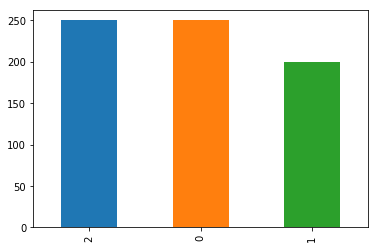

In [6]:
'''
0 Represents Normal 
1 Represents COVID-19
2 Represents Viral Pneumonia 
'''
df['category'].value_counts().plot.bar()

# Callbacks

## Early Stop

To prevent overfitting, we will stop the learning after 10 epochs and if the val_loss value has not decreased

In [8]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
earlystop = EarlyStopping(patience=30)

# Learning Rate Reduction

We will reduce the learning rate when then accuracy does not increase for 2 steps

In [9]:
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy', 
                                            patience = 2, 
                                            verbose = 1, 
                                            factor = 0.5, 
                                            min_lr = 0.000001)

callbacks = [earlystop, learning_rate_reduction]

In [10]:
df["category"] = df["category"].replace({0: 'Normal', 1: 'COVID-19', 2: 'Viral Pneumonia'}) 

# Shuffle Data

In [11]:
df = df.sample(frac=1).reset_index(drop=True)
df

,filename,category
0,NORMAL (92).png,Normal
1,Viral Pneumonia (161).png,Viral Pneumonia
2,NORMAL (200).png,Normal
3,COVID-19 (94).png,COVID-19
4,NORMAL (150).png,Normal
...,...,...
695,Viral Pneumonia (178).png,Viral Pneumonia
696,NORMAL (157).png,Normal
697,Viral Pneumonia (121).png,Viral Pneumonia
698,COVID-19 (139).jpg,COVID-19


In [12]:
train_df, validate_df = train_test_split(df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

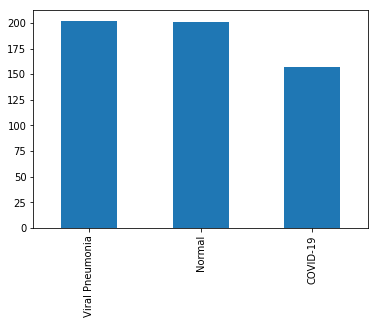

In [31]:
train_df['category'].value_counts().plot.bar()

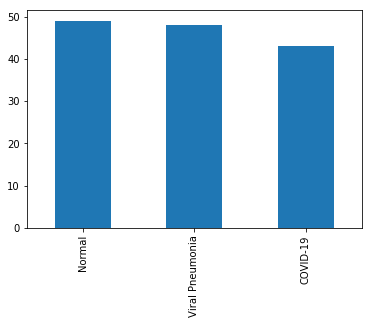

In [32]:
validate_df['category'].value_counts().plot.bar()

In [15]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size = 5

# Training Generator

In [16]:
train_datagen = ImageDataGenerator (
    
    rotation_range = 15,
    rescale = 1./255,
    
    shear_range = 0.1,
    zoom_range = 0.2,
    
    horizontal_flip = True,
    width_shift_range = 0.1,
    height_shift_range = 0.1
)

train_generator = train_datagen.flow_from_dataframe (
    
    train_df, 
    path + '\\train', 
    x_col = 'filename',
    y_col = 'category',
    target_size = IMAGE_SIZE,
    class_mode = 'categorical',
    batch_size = batch_size
)

Found 560 validated image filenames belonging to 3 classes.


# Validation Generator

In [17]:
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_dataframe (
    
    validate_df, 
    path + '\\train', 
    x_col ='filename',
    y_col = 'category',
    target_size = IMAGE_SIZE,
    class_mode = 'categorical',
    batch_size = batch_size
)

Found 140 validated image filenames belonging to 3 classes.


In [20]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax', name='predictions')) 

model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 198, 198, 32)      896       
_________________________________________________________________
batch_normalization_8 (Batch (None, 198, 198, 32)      128       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 99, 99, 32)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 97, 97, 64)        18496     
_________________________________________________________________
batch_normalization_9 (Batch (None, 97, 97, 64)        256       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 48, 48, 64)       

In [21]:
from keras.models import load_model
model.load_weights('COVID-Model-200-3-5-25.h5')

# Prepare Testing Data

In [22]:
test_filenames = os.listdir(path + 'test')

test_df = pd.DataFrame({
    'filename': test_filenames
})

nb_samples = test_df.shape[0]

In [23]:
test_df = test_df.sample(frac=1).reset_index(drop=True)
test_df

,filename
0,NORMAL (593).png
1,NORMAL (572).png
2,Viral Pneumonia (530).png
3,Viral Pneumonia (414).png
4,NORMAL (375).png
...,...
684,NORMAL (430).png
685,NORMAL (579).png
686,Viral Pneumonia (535).png
687,Viral Pneumonia (450).png


# Create Testing Generator

In [24]:
test_gen = ImageDataGenerator(rescale = 1./255)
test_generator = test_gen.flow_from_dataframe(
    
    test_df, 
    path + '\\test', 
    x_col = 'filename',
    y_col = None,
    class_mode = None,
    target_size = IMAGE_SIZE,
    batch_size = batch_size,
    shuffle = False
)

Found 689 validated image filenames.


# Form Predictions

In [25]:
predict = model.predict_generator(test_generator, steps = np.ceil(nb_samples/batch_size))

## Pick the category that has the highest probability 

In [26]:
test_df['category'] = np.argmax(predict, axis=-1)

In [27]:
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)

In [28]:
test_df['category'] = test_df['category'].replace({'Normal': 0, 'COVID-19': 1, 'Viral Pneumonia': 2})

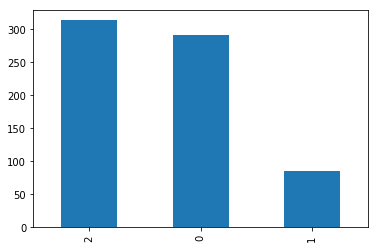

In [29]:
test_df['category'].value_counts().plot.bar()

# Calculate Model Accuracy

In [31]:
sample_test = test_df
correctPredictions = 0

correctNormalPred = 0
correctCovidPred = 0
correctPneuPred = 0

totalNormalPred = 0
totalCovidPred = 0
totalPneuPred = 0

for index, row in sample_test.iterrows():
    
    filename = row['filename']
    prediction = row['category']
    
    img = load_img(path + 'test\\' + filename, target_size=IMAGE_SIZE)
    
    if 'NORMAL' in filename:
        
        if prediction == 0:
            correctPredictions += 1
            correctNormalPred += 1
            
        totalNormalPred += 1
    
    if 'COVID-19' in filename:
        
        if prediction == 1: 
            correctPredictions += 1
            correctCovidPred += 1
            
        totalCovidPred += 1
    
    if 'Viral Pneumonia' in filename:
        
        if prediction == 2: 
            correctPredictions += 1
            correctPneuPred += 1
            
        totalPneuPred += 1
    

# Predicted result with images

In [32]:
print('Model Accuracy:', "{:.2%}".format(correctPredictions / test_df.shape[0]))
print('Correct Predictions:', correctPredictions, 'Total Predictions:', test_df.shape[0])

print('\nNormal Predictions:', correctNormalPred, 'Accuracy', "{:.2%}".format(correctNormalPred /  totalNormalPred))
print('COVID-19 Predictions:', correctCovidPred, 'Accuracy', "{:.2%}".format(correctCovidPred /  totalCovidPred))
print('Viral Pneumonia Predictions:', correctPneuPred, 'Accuracy', "{:.2%}".format(correctPneuPred / totalPneuPred))

Model Accuracy: 93.03%
Correct Predictions: 641 Total Predictions: 689

Normal Predictions: 278 Accuracy 92.67%
COVID-19 Predictions: 79 Accuracy 88.76%
Viral Pneumonia Predictions: 284 Accuracy 94.67%


In [33]:
actual = []
pred = []

for row in test_df.iterrows():
    
    filename = row[1][0]
    
    if 'NORMAL' in filename: actual.append(0)
    if 'COVID-19' in filename: actual.append(1)
    if 'Viral Pneumonia' in filename: actual.append(2)
        
    pred.append(row[1][1])

In [34]:
print(classification_report(actual, pred))

              precision    recall  f1-score   support

           0       0.96      0.93      0.94       300
           1       0.93      0.89      0.91        89
           2       0.91      0.95      0.93       300

    accuracy                           0.93       689
   macro avg       0.93      0.92      0.93       689
weighted avg       0.93      0.93      0.93       689



In [35]:
confusion_matrix(actual, pred)

array([[278,   3,  19],
       [  0,  79,  10],
       [ 13,   3, 284]], dtype=int64)

In [36]:
cf = confusion_matrix(actual, pred)

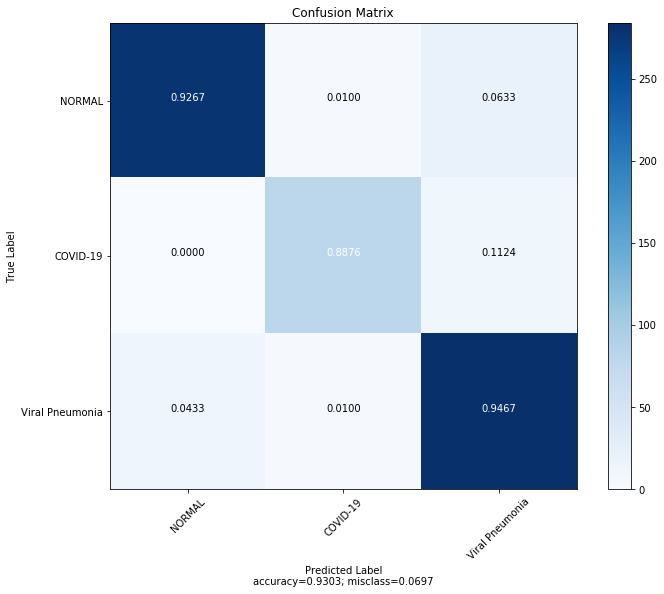

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import itertools
    
cf = confusion_matrix(actual, pred)

def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion Matrix',
                          cmap=None,
                          normalize=True):

    accuracy = np.trace(cm) / np.sum(cm).astype('float')
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()
    
target_names = ['NORMAL','COVID-19', 'Viral Pneumonia']

plot_confusion_matrix(cf, target_names)

# 5-Fold Cross Validation

In [13]:
def getModelAccuracy(dataframe):
    sample_test = dataframe
    correctPredictions = 0

    correctNormalPred = 0
    correctCovidPred = 0
    correctPneuPred = 0

    totalNormalPred = 0
    totalCovidPred = 0
    totalPneuPred = 0

    for index, row in sample_test.iterrows():

        filename = row['filename']
        prediction = row['category']

        img = load_img(path + 'CrossValidationDataset\\' + filename, target_size=IMAGE_SIZE)

        if 'NORMAL' in filename:

            if prediction == 0:
                correctPredictions += 1
                correctNormalPred += 1

            totalNormalPred += 1

        if 'COVID-19' in filename:

            if prediction == 1: 
                correctPredictions += 1
                correctCovidPred += 1

            totalCovidPred += 1

        if 'Viral Pneumonia' in filename:

            if prediction == 2: 
                correctPredictions += 1
                correctPneuPred += 1

            totalPneuPred += 1
            
    print('Model Accuracy:', "{:.2%}".format(correctPredictions / test_df.shape[0]))
    print('Correct Predictions:', correctPredictions, 'Total Predictions:', test_df.shape[0])

    print('\nNormal Predictions:', correctNormalPred, 'Accuracy', "{:.2%}".format(correctNormalPred /  totalNormalPred))
    print('COVID-19 Predictions:', correctCovidPred, 'Accuracy', "{:.2%}".format(correctCovidPred /  totalCovidPred))
    print('Viral Pneumonia Predictions:', correctPneuPred, 'Accuracy', "{:.2%}".format(correctPneuPred / totalPneuPred))
    
    return (correctPredictions / test_df.shape[0]) * 100

In [38]:
from sklearn.model_selection import KFold
inputs = np.concatenate((df['filename'], test_df['filename']), axis=0)
targets = np.concatenate((df['category'], test_df['category']), axis=0)

Found 888 validated image filenames belonging to 3 classes.
Found 223 validated image filenames belonging to 3 classes.
------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/25
112/112 [==============================] - 87s 774ms/step - loss: 1.3899 - accuracy: 0.5269 - val_loss: 3.7480 - val_accuracy: 0.4286
Epoch 2/25
112/112 [==============================] - 85s 762ms/step - loss: 1.0401 - accuracy: 0.6482 - val_loss: 7.4869 - val_accuracy: 0.3551
Epoch 3/25
112/112 [==============================] - 85s 757ms/step - loss: 0.9326 - accuracy: 0.7115 - val_loss: 4.3475 - val_accuracy: 0.4500
Epoch 4/25
112/112 [==============================] - 92s 818ms/step - loss: 1.0062 - accuracy: 0.6714 - val_loss: 7.3746 - val_accuracy: 0.3913
Epoch 5/25
112/112 [==============================] - 96s 854ms/step - loss: 0.8407 - accuracy: 0.7097 - val_loss: 1.4162 - val_accuracy: 0.4855
Epoch 6/25
112/112 [==============================] - 84s 

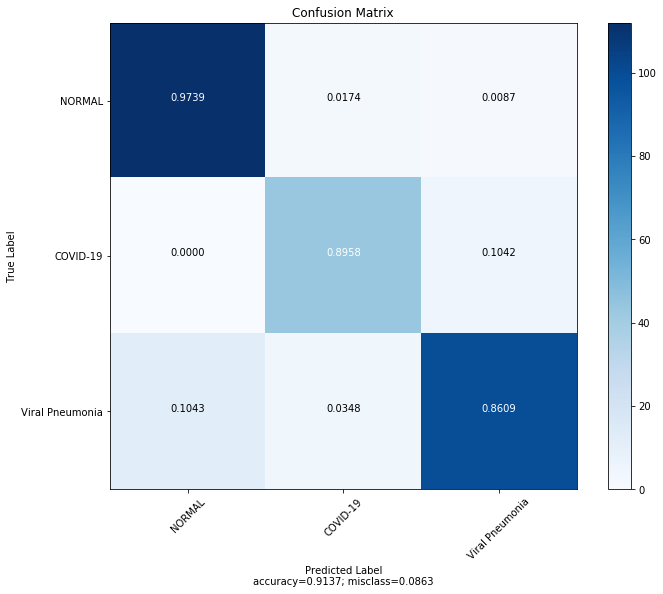

Found 888 validated image filenames belonging to 3 classes.
Found 223 validated image filenames belonging to 3 classes.
------------------------------------------------------------------------
Training for fold 2 ...
Epoch 1/25
112/112 [==============================] - 86s 772ms/step - loss: 1.4379 - accuracy: 0.5161 - val_loss: 1.0911 - val_accuracy: 0.3786
Epoch 2/25
112/112 [==============================] - 85s 757ms/step - loss: 1.1927 - accuracy: 0.5893 - val_loss: 3.2306 - val_accuracy: 0.3986
Epoch 3/25
112/112 [==============================] - 85s 755ms/step - loss: 1.0082 - accuracy: 0.6505 - val_loss: 8.0823 - val_accuracy: 0.3786
Epoch 4/25
112/112 [==============================] - 94s 836ms/step - loss: 0.9718 - accuracy: 0.6429 - val_loss: 4.1655 - val_accuracy: 0.4420
Epoch 5/25
112/112 [==============================] - 99s 885ms/step - loss: 0.8512 - accuracy: 0.6738 - val_loss: 0.4498 - val_accuracy: 0.7971
Epoch 6/25
112/112 [==============================] - 111s

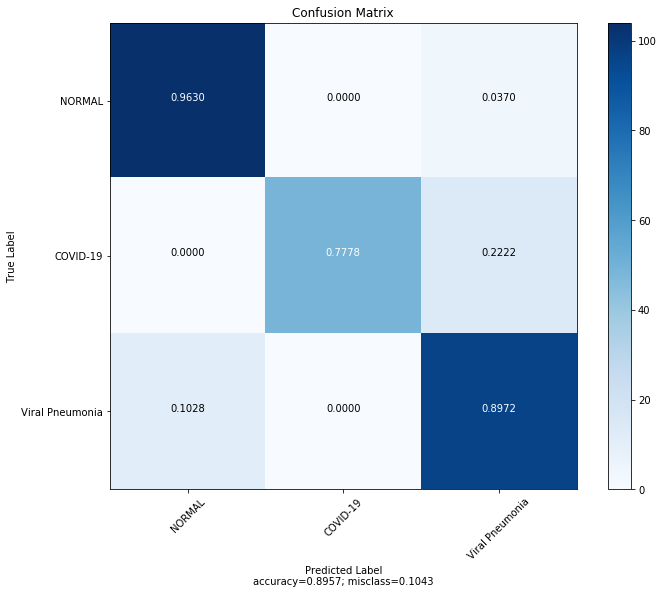

Found 888 validated image filenames belonging to 3 classes.
Found 223 validated image filenames belonging to 3 classes.
------------------------------------------------------------------------
Training for fold 3 ...
Epoch 1/25
112/112 [==============================] - 85s 759ms/step - loss: 1.3776 - accuracy: 0.4892 - val_loss: 1.9318 - val_accuracy: 0.3714
Epoch 2/25
112/112 [==============================] - 84s 750ms/step - loss: 1.2032 - accuracy: 0.5786 - val_loss: 1.0576 - val_accuracy: 0.3768
Epoch 3/25
112/112 [==============================] - 87s 774ms/step - loss: 1.0407 - accuracy: 0.6272 - val_loss: 3.2407 - val_accuracy: 0.4571
Epoch 4/25
112/112 [==============================] - 92s 823ms/step - loss: 0.8030 - accuracy: 0.7268 - val_loss: 1.7325 - val_accuracy: 0.5725
Epoch 5/25
112/112 [==============================] - 85s 759ms/step - loss: 0.8507 - accuracy: 0.6846 - val_loss: 2.8870 - val_accuracy: 0.5217
Epoch 6/25
112/112 [==============================] - 87s 

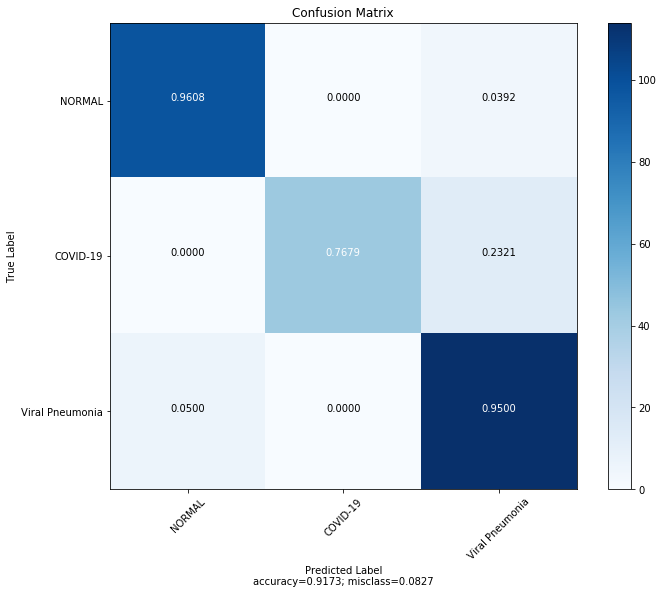

Found 888 validated image filenames belonging to 3 classes.
Found 223 validated image filenames belonging to 3 classes.
------------------------------------------------------------------------
Training for fold 4 ...
Epoch 1/25
112/112 [==============================] - 86s 771ms/step - loss: 1.3662 - accuracy: 0.5339 - val_loss: 2.4538 - val_accuracy: 0.4286
Epoch 2/25
112/112 [==============================] - 84s 751ms/step - loss: 1.0330 - accuracy: 0.6577 - val_loss: 3.7259 - val_accuracy: 0.4058
Epoch 3/25
112/112 [==============================] - 84s 754ms/step - loss: 0.9984 - accuracy: 0.6523 - val_loss: 1.2211 - val_accuracy: 0.5500
Epoch 4/25
112/112 [==============================] - 84s 754ms/step - loss: 0.9495 - accuracy: 0.6661 - val_loss: 2.7750 - val_accuracy: 0.4130
Epoch 5/25
112/112 [==============================] - 85s 755ms/step - loss: 0.8022 - accuracy: 0.7276 - val_loss: 5.7832 - val_accuracy: 0.4638

Epoch 00005: ReduceLROnPlateau reducing learning rate to 

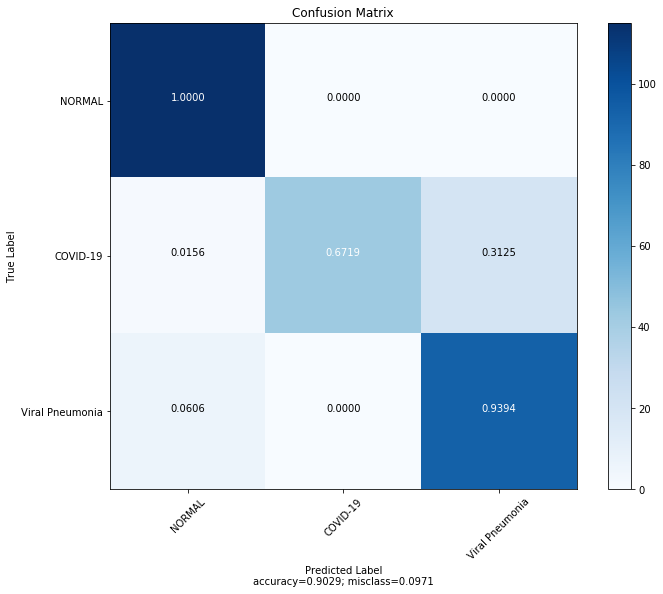

Found 889 validated image filenames belonging to 3 classes.
Found 223 validated image filenames belonging to 3 classes.
------------------------------------------------------------------------
Training for fold 5 ...
Epoch 1/25
112/112 [==============================] - 87s 781ms/step - loss: 1.2766 - accuracy: 0.5564 - val_loss: 1.2488 - val_accuracy: 0.4143
Epoch 2/25
112/112 [==============================] - 85s 755ms/step - loss: 1.0689 - accuracy: 0.6339 - val_loss: 3.5358 - val_accuracy: 0.4203
Epoch 3/25
112/112 [==============================] - 85s 762ms/step - loss: 1.0355 - accuracy: 0.6655 - val_loss: 5.0943 - val_accuracy: 0.3929
Epoch 4/25
112/112 [==============================] - 85s 757ms/step - loss: 0.9187 - accuracy: 0.6834 - val_loss: 0.8491 - val_accuracy: 0.4565
Epoch 5/25
112/112 [==============================] - 85s 757ms/step - loss: 0.7729 - accuracy: 0.7482 - val_loss: 0.4967 - val_accuracy: 0.7971
Epoch 6/25
112/112 [==============================] - 85s 

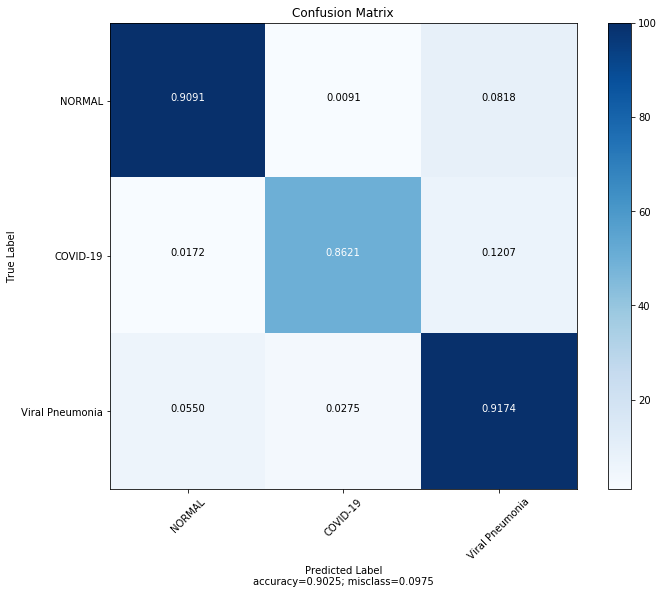

[91.36690647482014, 89.568345323741, 91.72661870503596, 90.28776978417267, 90.25270758122743]
[[[0, 2, 0, 1, 1, 0, 0, 2, 0, 2, 2, 1, 1, 1, 0, 2, 0, 0, 1, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 1, 0, 0, 1, 2, 0, 2, 1, 2, 2, 1, 0, 0, 2, 0, 0, 0, 0, 1, 2, 0, 1, 0, 1, 0, 2, 0, 1, 0, 2, 2, 0, 2, 1, 2, 2, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 0, 2, 1, 0, 1, 1, 0, 1, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 1, 0, 0, 2, 2, 0, 0, 1, 0, 2, 2, 2, 1, 2, 2, 1, 0, 0, 0, 1, 2, 0, 0, 2, 2, 1, 1, 2, 1, 1, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 1, 2, 0, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 1, 2, 1, 0, 2, 0, 2, 2, 0, 0, 0, 1, 2, 1, 0, 2, 2, 2, 2, 0, 0, 0, 1, 0, 0, 0, 1, 2, 2, 2, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 1, 0, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 1, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 1, 2, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 1, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2], [0, 2, 0, 2, 1, 0, 0, 2, 0, 2, 2, 1, 1, 1, 0, 1, 0, 0, 2, 2, 0, 0, 0

In [42]:
fold_no = 1
batch_size = 5
epochs = 25

acc_per_fold = []
perf_per_fold = []

# Define the K-fold Cross Validator
kfold = KFold(n_splits=5, shuffle=True)

for train, test in kfold.split(inputs, targets):
    
    #Create Model
    model = Sequential()

    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(3, activation='softmax', name='predictions')) 

    model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy']) 
    
    
    ##Separate Training Data
    categories = []
    
    for img in inputs[train]:

        fileName = img.split('.')[0]

        if 'NORMAL' in fileName: categories.append(0)
        elif 'COVID-19' in fileName: categories.append(1)
        else: categories.append(2)

    cross_val_df = pd.DataFrame ({
        'filename': inputs[train],
        'category': categories
    })
    
    cross_val_df["category"] = cross_val_df["category"].replace({0: 'Normal', 1: 'COVID-19', 2: 'Viral Pneumonia'})
    
    train_df, validate_df = train_test_split(cross_val_df, test_size=0.20)
    train_df = train_df.reset_index(drop=True)
    validate_df = validate_df.reset_index(drop=True)
    
    ##Callbacks 
    learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy', 
                                            patience = 2, 
                                            verbose = 1, 
                                            factor = 0.5, 
                                            min_lr = 0.00001)

    callbacks = [earlystop, learning_rate_reduction]
    
    ##ImageGenerator 
    train_datagen = ImageDataGenerator (
    
    rotation_range = 15,
    rescale = 1./255,
    
    shear_range = 0.1,
    zoom_range = 0.2,
    
    horizontal_flip = True,
    width_shift_range = 0.1,
    height_shift_range = 0.1
    )

    train_generator = train_datagen.flow_from_dataframe (

        train_df, 
        path + '\\CrossValidationDataset', 
        x_col = 'filename',
        y_col = 'category',
        target_size = IMAGE_SIZE,
        class_mode = 'categorical',
        batch_size = batch_size
    )
    
    validation_datagen = ImageDataGenerator(rescale=1./255)

    validation_generator = validation_datagen.flow_from_dataframe (

        validate_df, 
        path + '\\CrossValidationDataset', 
        x_col ='filename',
        y_col = 'category',
        target_size = IMAGE_SIZE,
        class_mode = 'categorical',
        batch_size = batch_size
    )
    
    
    # Generate a print
    print('------------------------------------------------------------------------')
    print(f'Training for fold {fold_no} ...')
    
    
    history = model.fit_generator (
    
    train_generator, 
    epochs = epochs,
    validation_data = validation_generator,
    validation_steps = total_validate//batch_size,
    steps_per_epoch = total_train//batch_size,
    callbacks = callbacks
        
    )
    
    
    ##Separate Testing Data 
    test_filenames = []
    
    for img in inputs[test]:

        test_filenames.append(img)
        
    test_df = pd.DataFrame({
        'filename': test_filenames
    })
    
    nb_samples = test_df.shape[0]
    
    test_gen = ImageDataGenerator(rescale = 1./255)
    test_generator = test_gen.flow_from_dataframe(

        test_df, 
        path + '\\CrossValidationDataset', 
        x_col = 'filename',
        y_col = None,
        class_mode = None,
        target_size = IMAGE_SIZE,
        batch_size = batch_size,
        shuffle = False
    )
        
    #Get Test Data Predictions 
    predict = model.predict_generator(test_generator, steps = np.ceil(nb_samples/batch_size))
    
    test_df['category'] = np.argmax(predict, axis=-1)
    label_map = dict((v,k) for k,v in train_generator.class_indices.items())
    test_df['category'] = test_df['category'].replace(label_map)
    test_df['category'] = test_df['category'].replace({'Normal': 0, 'COVID-19': 1, 'Viral Pneumonia': 2})

    
    actual = []
    pred = []

    for row in test_df.iterrows():

        filename = row[1][0]

        if 'NORMAL' in filename: actual.append(0)
        if 'COVID-19' in filename: actual.append(1)
        if 'Viral Pneumonia' in filename: actual.append(2)

        pred.append(row[1][1])
    
    print(test_df[0:30])
    print(classification_report(actual, pred))
    print(confusion_matrix(actual, pred))
    
    
    # Increase fold number
    fold_no = fold_no + 1

    
    # Get performance metrics
    
    accuracy = getModelAccuracy(test_df)
    acc_per_fold.append(accuracy)
    perf_per_fold.append([actual, pred])
    cf = confusion_matrix(actual, pred)
    
    target_names = ['NORMAL','COVID-19', 'Viral Pneumonia']
    plot_confusion_matrix(cf, target_names)
    

print(acc_per_fold)
print(perf_per_fold)

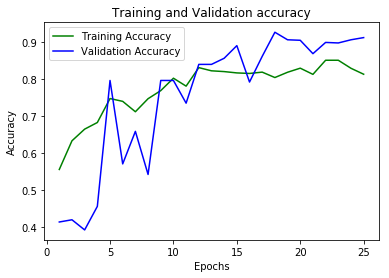

In [46]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
numEpochs = range(1,  epochs + 1)
plt.plot(numEpochs, accuracy, 'g', label='Training Accuracy')
plt.plot(numEpochs, val_accuracy, 'b', label='Validation Accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [45]:
model.save('CrossValidatedModel.h5')

# Visualizing CNN Model

It is crucial that we visualize what our model is doing – and on what basis it is making its predictions. Saliency maps form a visualization of the pixels in the image that contribute the most to predictions by the model. 

In [39]:
from vis.visualization import visualize_saliency
from vis.utils import utils
import matplotlib.pyplot as plt
import scipy.ndimage as ndimage
import numpy as np
import cv2
from keras import activations
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import load_img, img_to_array
import keras.backend as K
import sys 
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions

# Display
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from keras.preprocessing import image
from vis.visualization import visualize_cam, overlay

In [19]:
from keras.models import load_model
model = load_model('COVID-Model-200-5-5-30.h5')

In [20]:
# Find the index of the final convolutional layer
layer_index_conv = utils.find_layer_idx(model, 'conv2d_5')

#Find index of the last layer 
layer_index_pred = utils.find_layer_idx(model, 'predictions')

In [21]:
# Swap softmax with linear
model.layers[layer_index_pred].activation = activations.linear
model = utils.apply_modifications(model)  

In [66]:
indicies = [[2, 11, 17, 19, 32, 44, 48, 50, 64, 65], [8, 9, 10, 11, 18, 22, 52, 58, 138, 167], [3, 8, 9, 16, 43, 48, 62, 96, 99, 112]]        

def displaySaliencyMapCategory(category, ind):

    for index in indicies[ind]:

        img_path = 'train/{} ({}).png'.format(category, index)
        
        try:
            image = cv2.imread(img_path)
            image = cv2.resize(image, (200, 200)) 
        except:
            img_path = img_path[:-3] + 'jpg'
            image = cv2.imread(img_path)
            image = cv2.resize(image, (200, 200)) 

        displaySaliencyMap(img_path[6 : ], image, ind)

In [12]:
def displaySaliencyMap(filename, image, category):
    
    visualization = visualize_saliency(model, layer_index_pred, filter_indices=category, seed_input=image, backprop_modifier=None, grad_modifier="absolute")

    gaus = ndimage.gaussian_filter(visualization, sigma=5)

    fig, axes = plt.subplots(1, 2, figsize = (15, 10))
    axes[0].imshow(image) 
    axes[0].set_title(filename)
    axes[1].imshow(image)
    axes[1].imshow(gaus,alpha=.7)
    axes[1].set_title('Saliency Map')

    plt.show() 

## Saliency Maps for COVID-19 X-Rays 

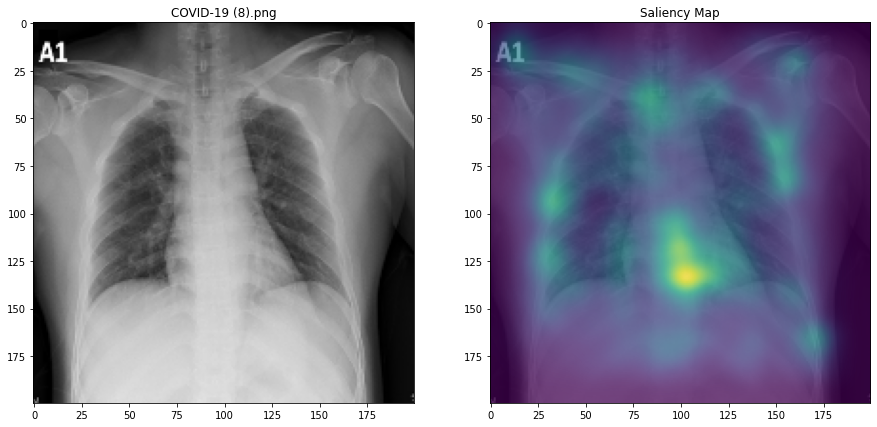

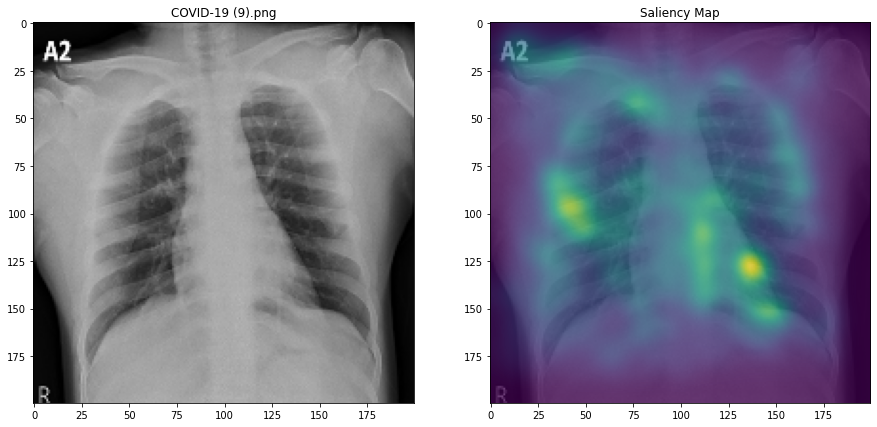

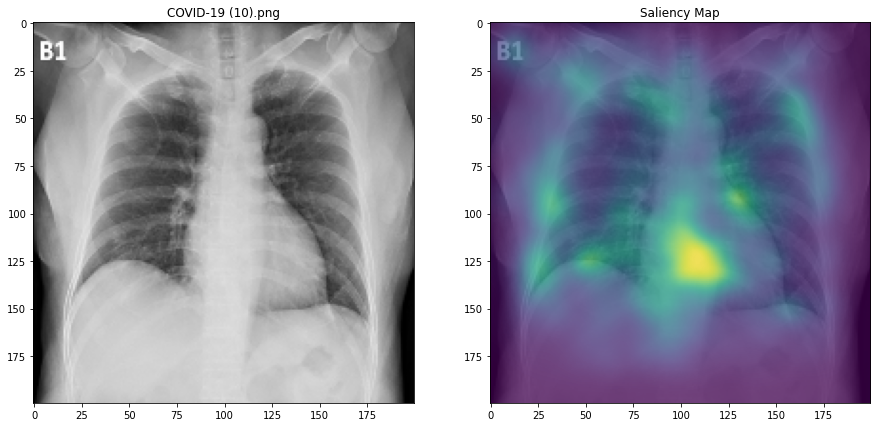

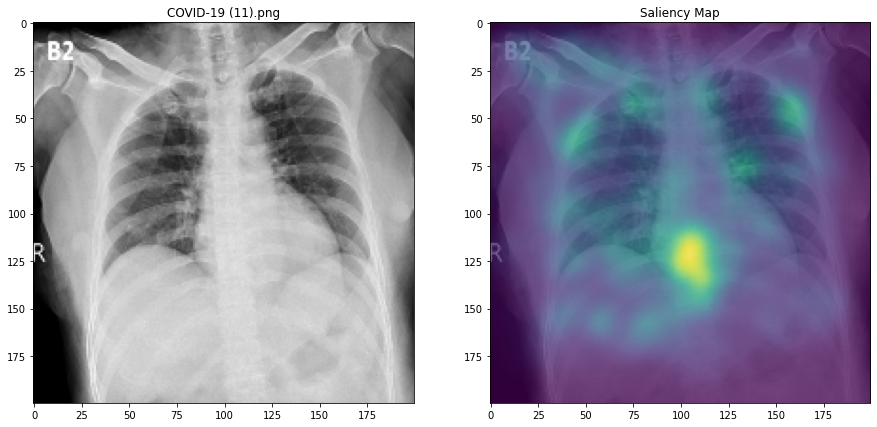

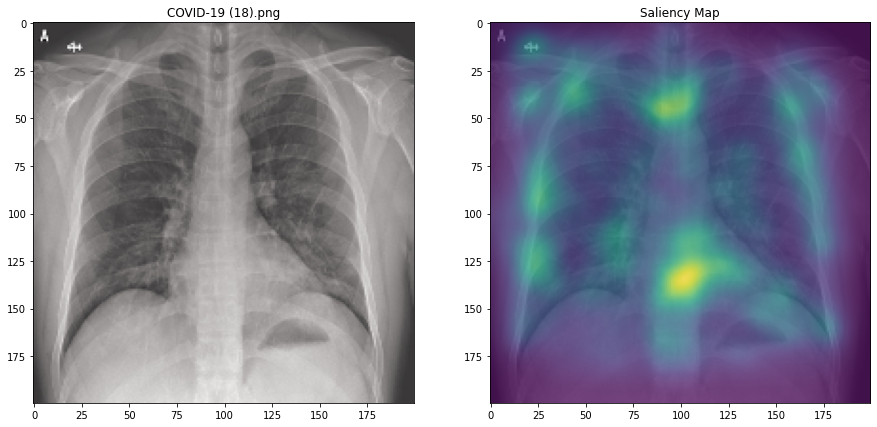

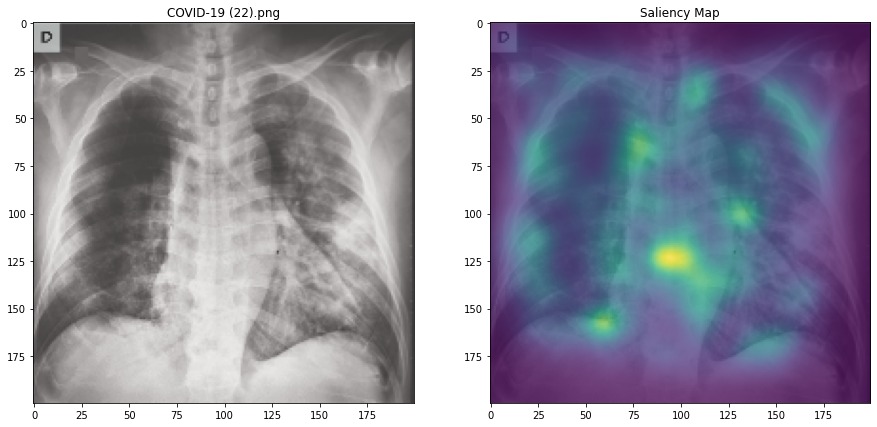

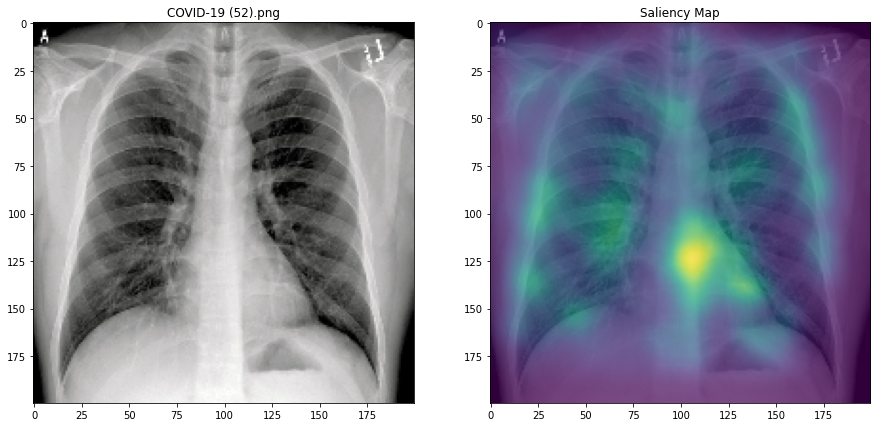

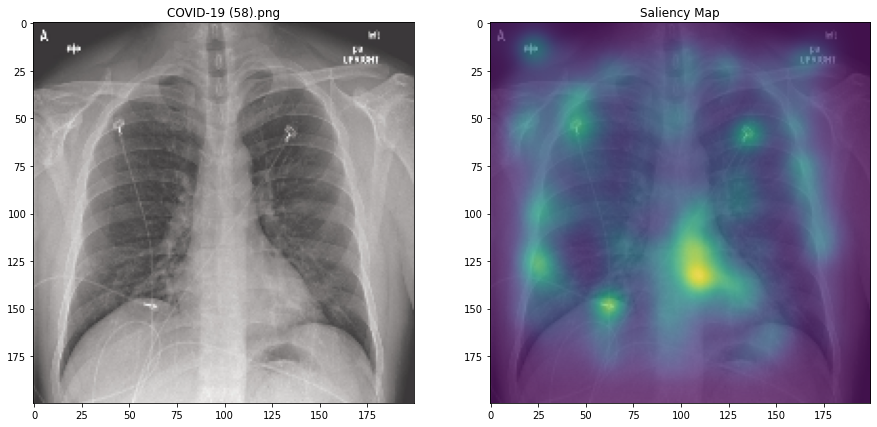

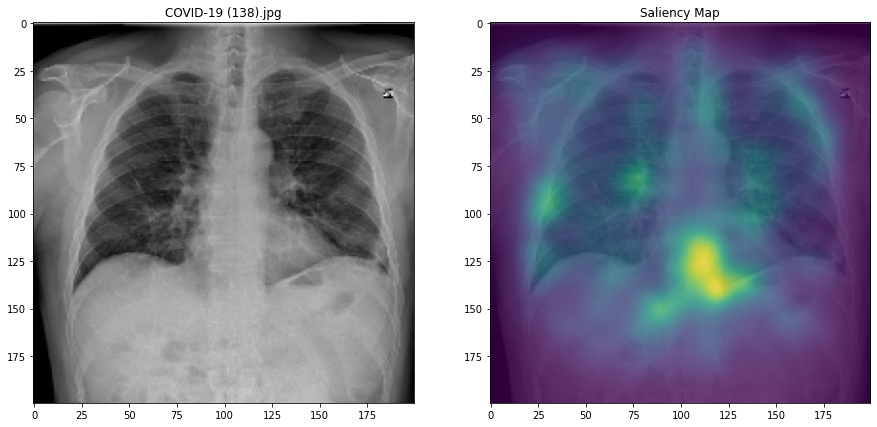

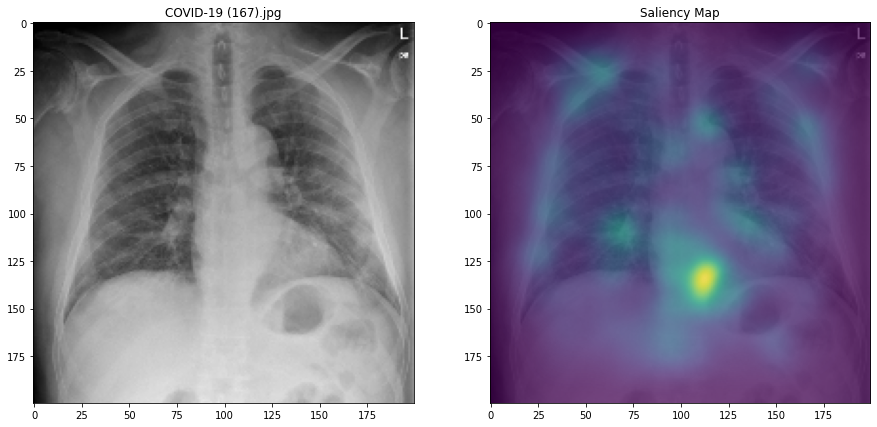

In [67]:
displaySaliencyMapCategory('COVID-19', 1)

# Saliency Maps for Viral Pneumonia X-Rays 

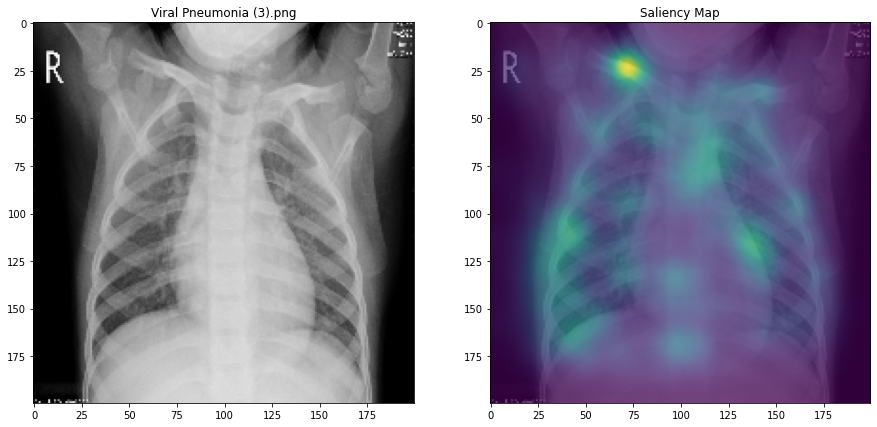

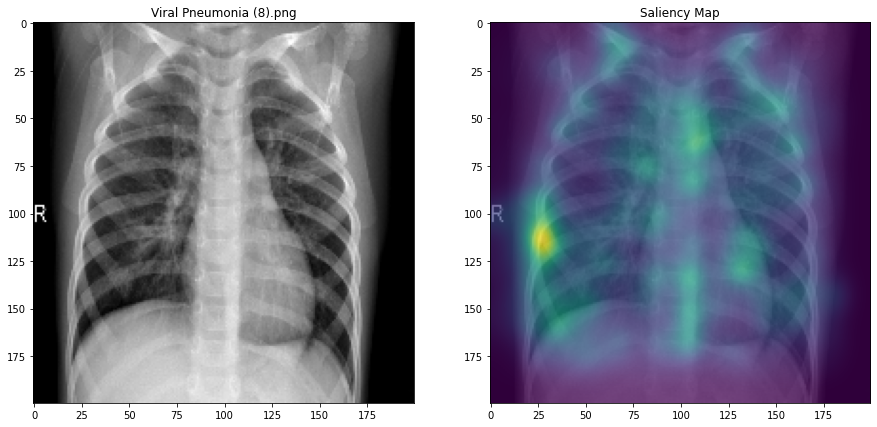

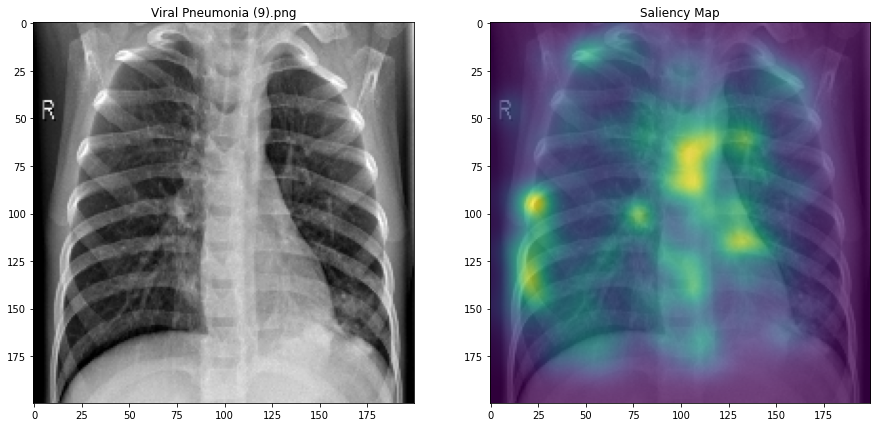

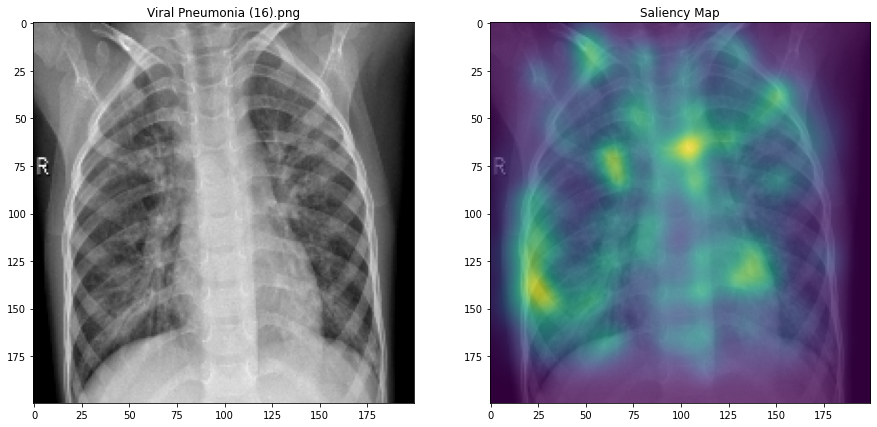

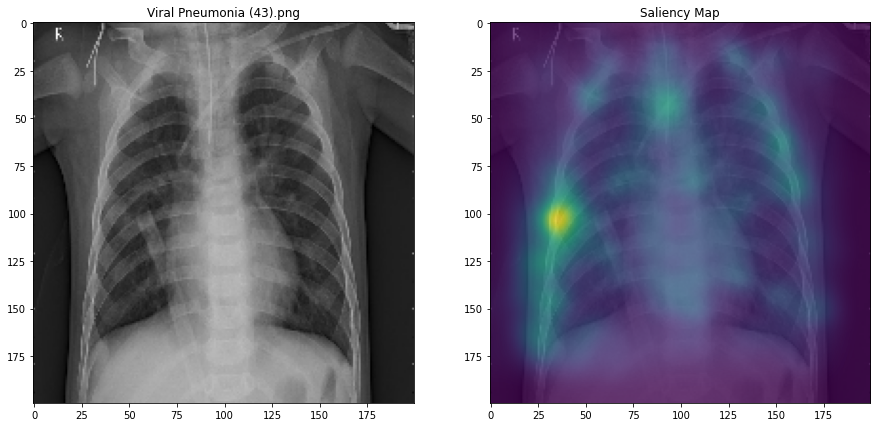

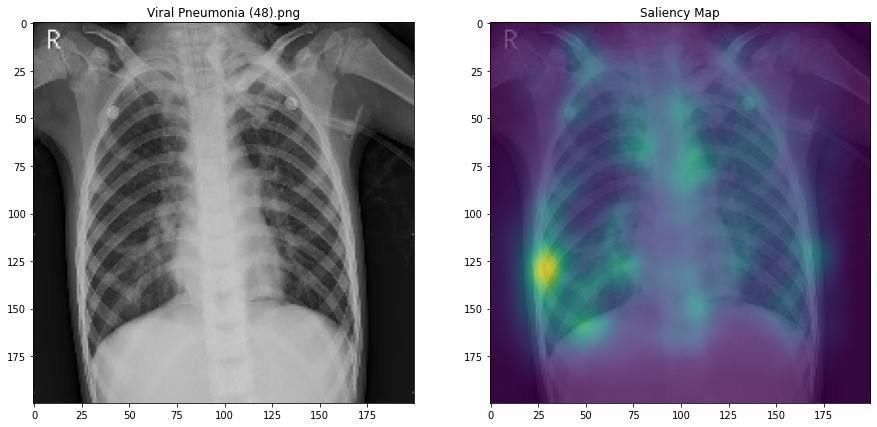

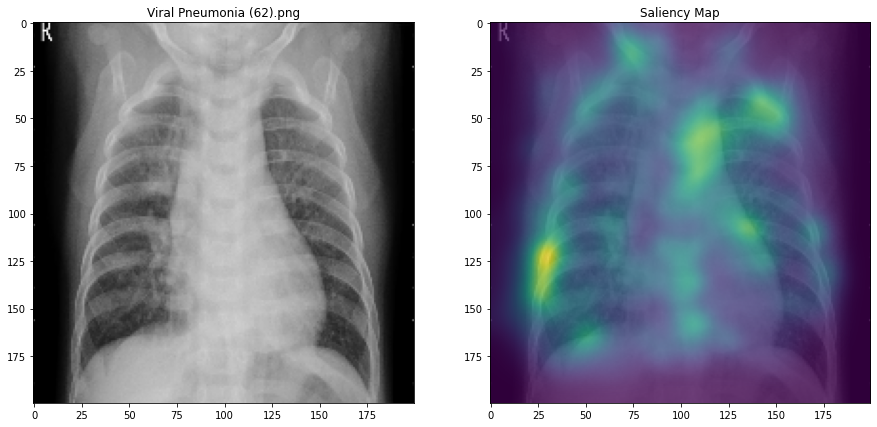

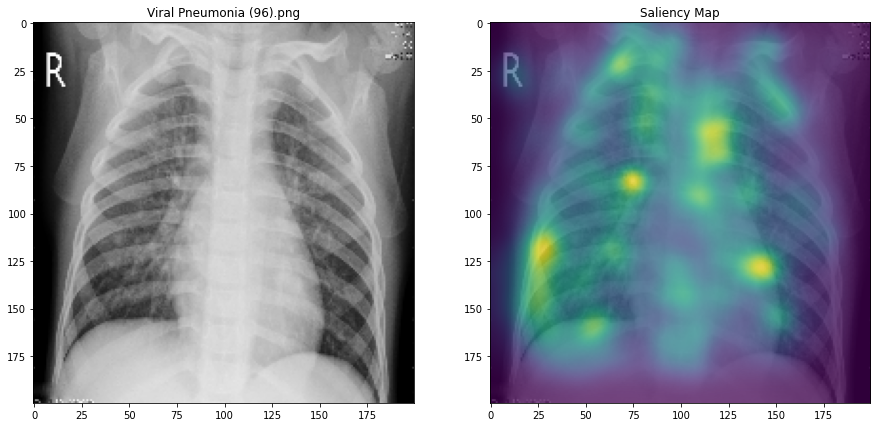

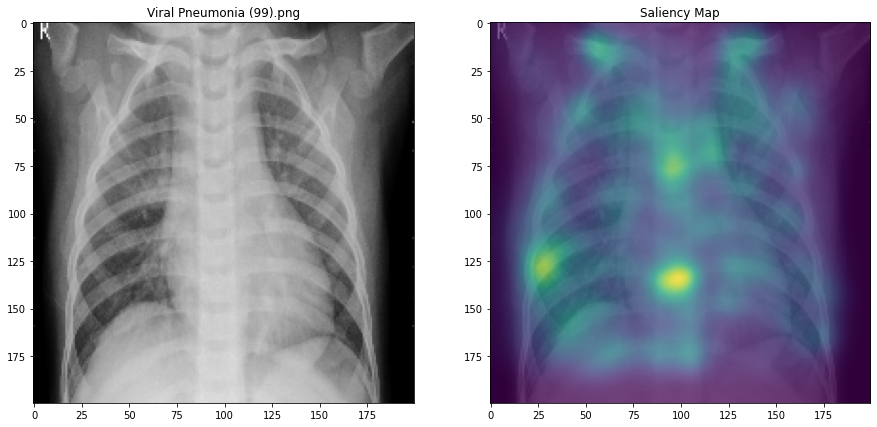

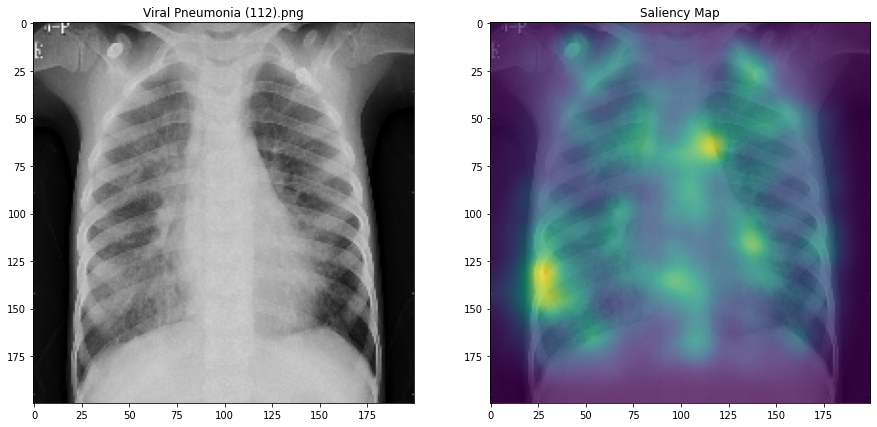

In [68]:
displaySaliencyMapCategory('Viral Pneumonia', 2)

# Saliency Maps for Normal X-Rays 

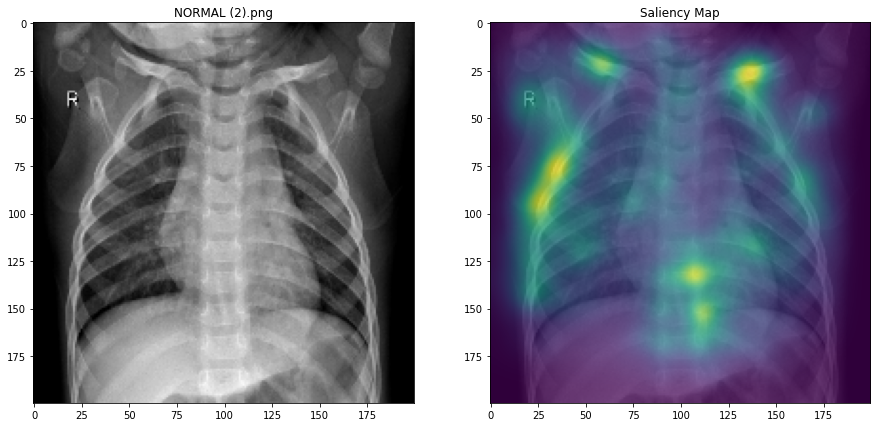

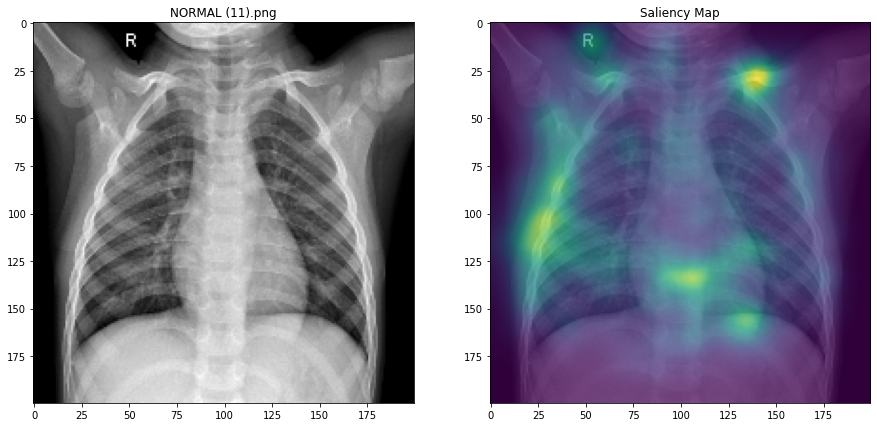

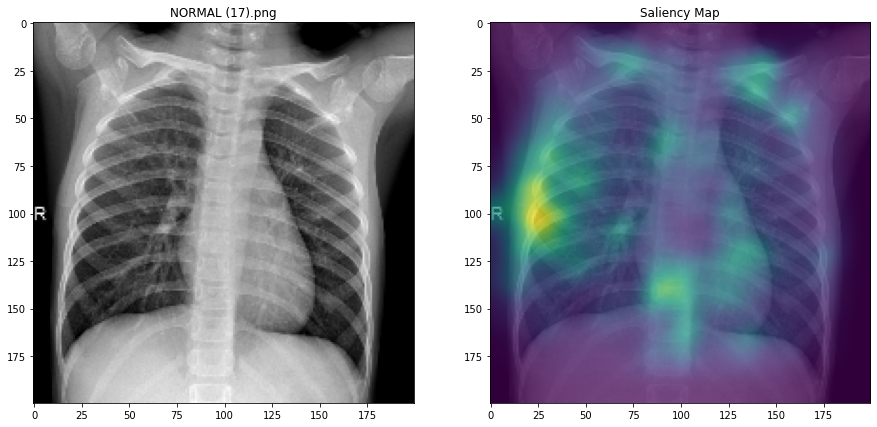

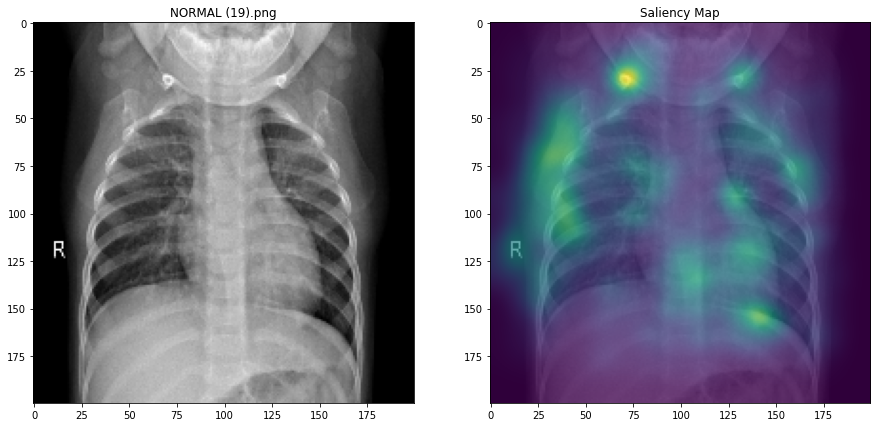

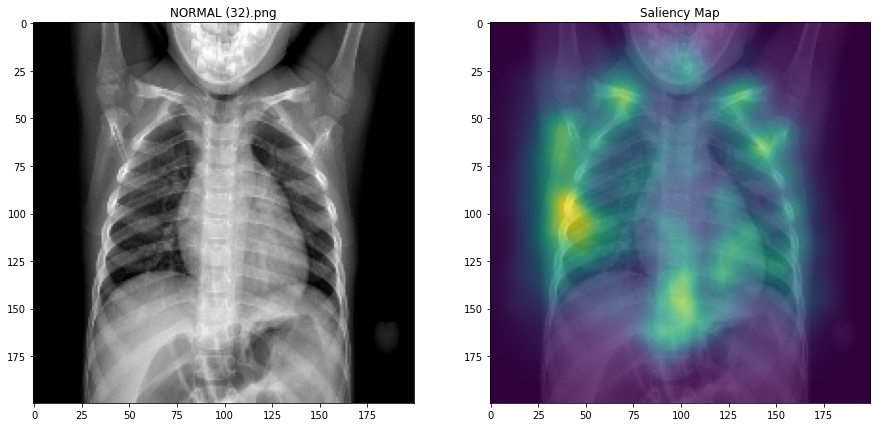

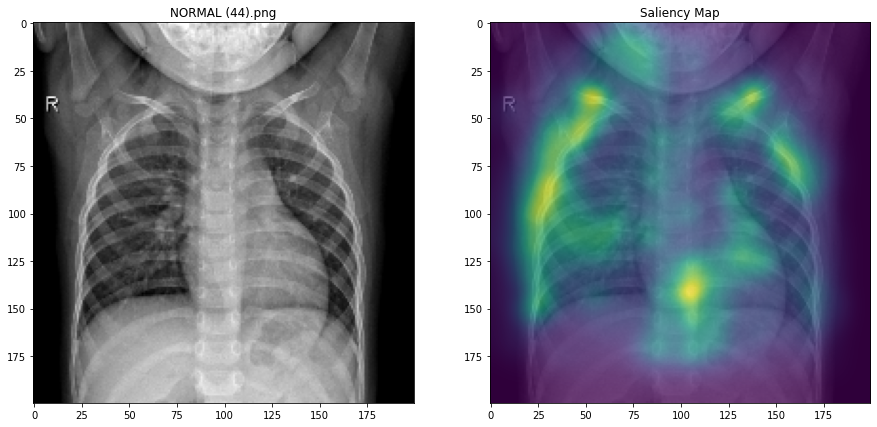

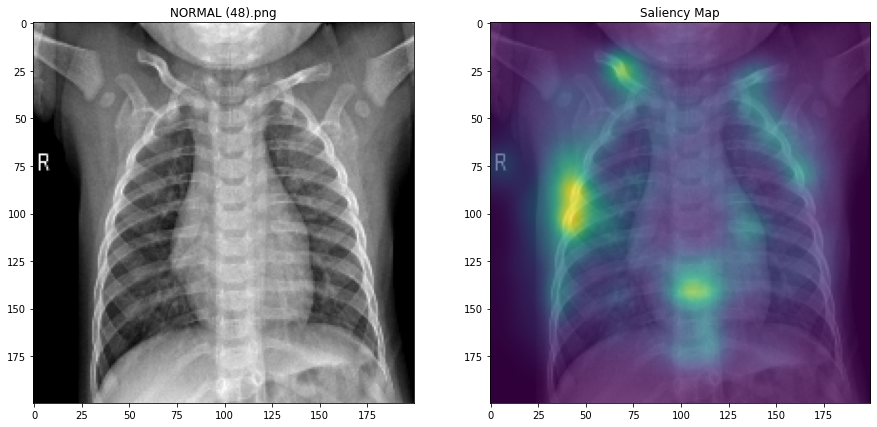

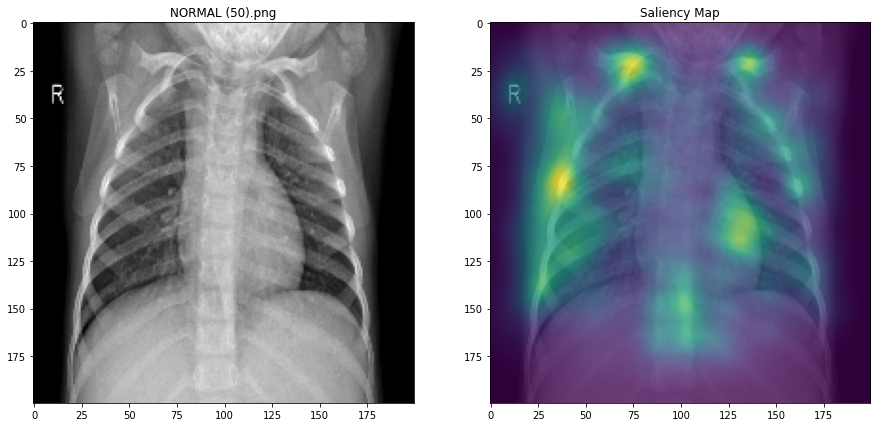

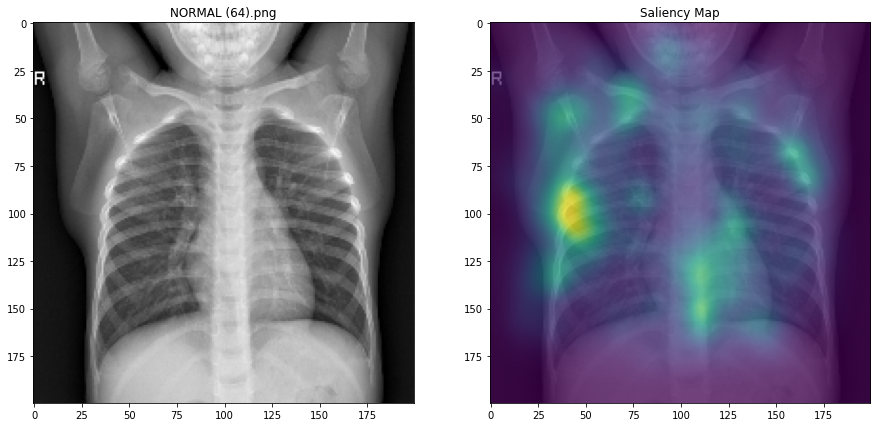

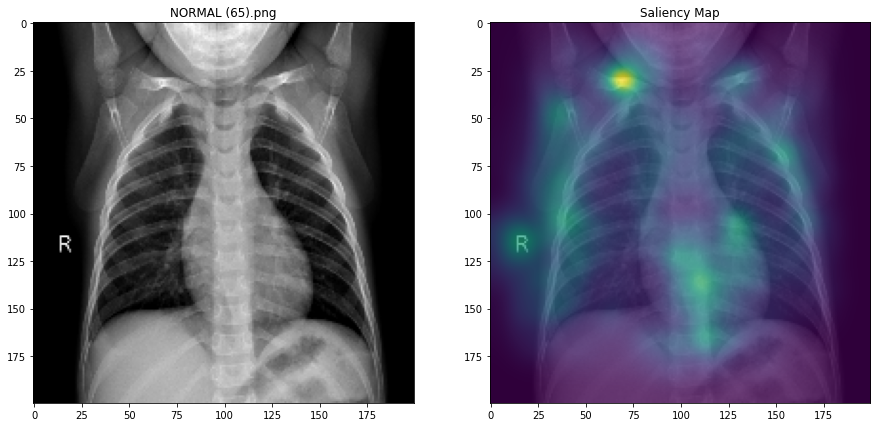

In [69]:
displaySaliencyMapCategory('NORMAL', 0)